In [2]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os

In [3]:
#takes path where the images are located and creates a gif and stores it in "gif" folder
def gif(path,name):
    files=os.listdir(f'{path}')
    image_path=[os.path.join(f'{path}',file) for file in files]
    images=[]
    for img in image_path:
        images.append(imageio.imread(img))
    imageio.mimwrite(f'gif/{name}.gif',images,fps=100)

In [4]:
np.random.seed(8)
#gradient of f(x,y)
def gradf(x,y):
    X=np.array([20*x,2*y])
    return X

def f(x,y):
    return 10*x**2+y**2

In [5]:
#selecting an initial starting point
Y=np.array([-5,6])
X=Y
#learning rate
eta=0.01
#number of iterations of the algorithm
max_iter=100
l=range(max_iter)

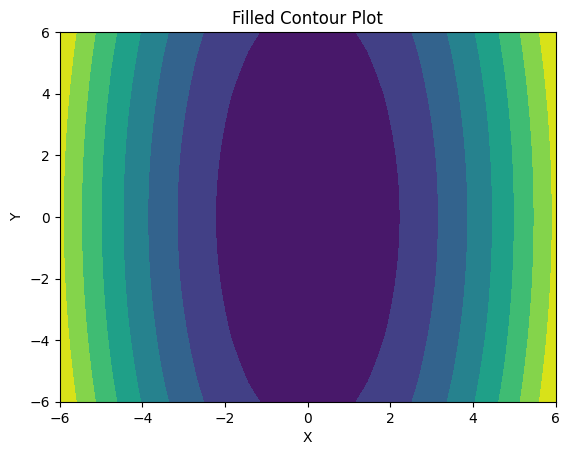

In [6]:
#displaying contour plot of f(x,y)
x = np.linspace(-6, 6, 30)
y = np.linspace(-6, 6, 30)

  
# Creating 2-D grid of features
[A, B] = np.meshgrid(x, y)
  
fig, ax = plt.subplots(1, 1)
  
C = 10*A ** 2 + B ** 2
  
# plots filled contour plot
ax.contourf(A, B, C)
  
ax.set_title('Filled Contour Plot')
ax.set_xlabel('X')
ax.set_ylabel('Y')
  
plt.show()

Vanilla SGD

In [7]:
#list to append value of X-coordinate after each iteration of Vanilla SGD
a1=[]
#list to append value of Y-coordinate after each iteration of Vanilla SGD
b1=[]
#list which contains valur of function after each iteration
val_f1=[]
#Vanilla SGD algorithm
for i in range(max_iter):
    val_f1.append(f(X[0],X[1]))
    a1.append(X[0])
    b1.append(X[1])
    X=X-eta*gradf(X[0],X[1])
print(X[0],X[1])

-1.018517988167243e-09 0.7957173353685193


C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1376290554.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1)
C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1807006928.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img))


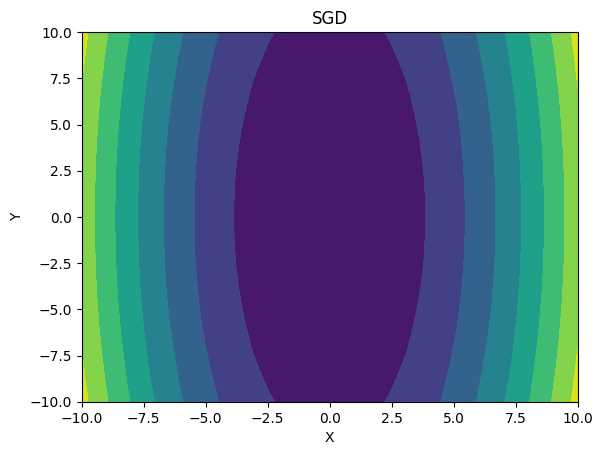

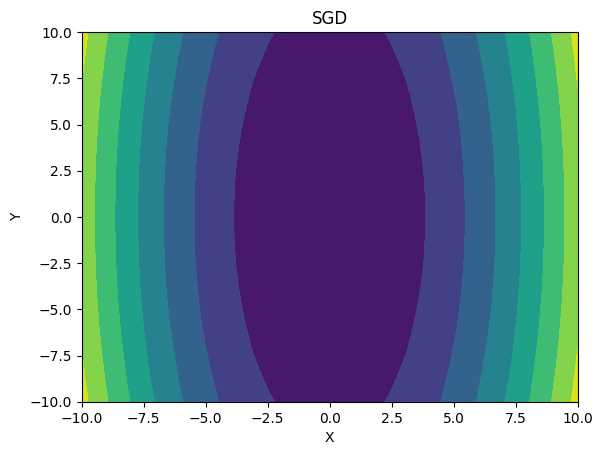

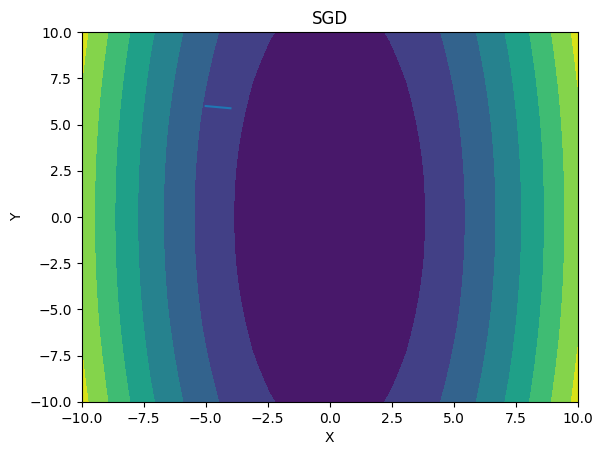

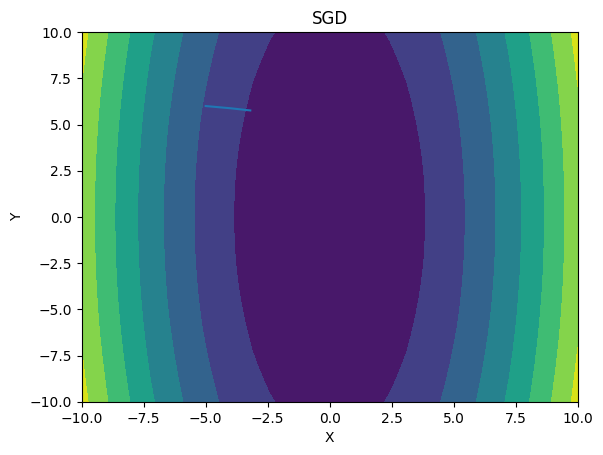

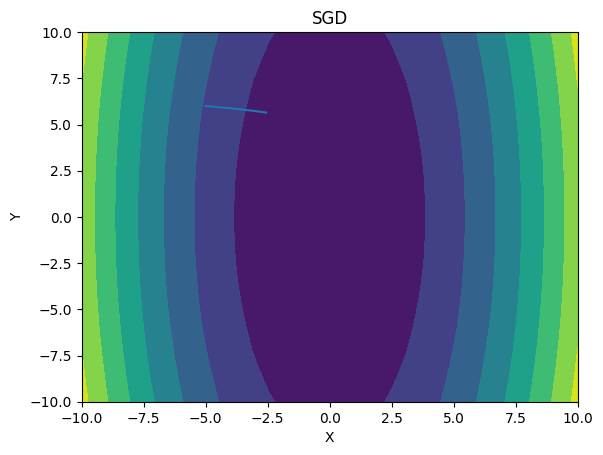

...

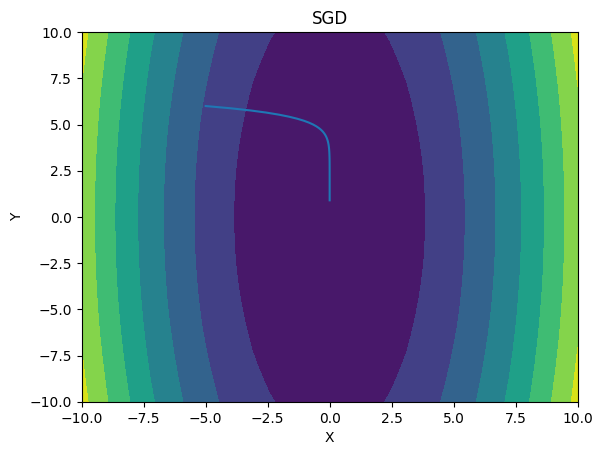

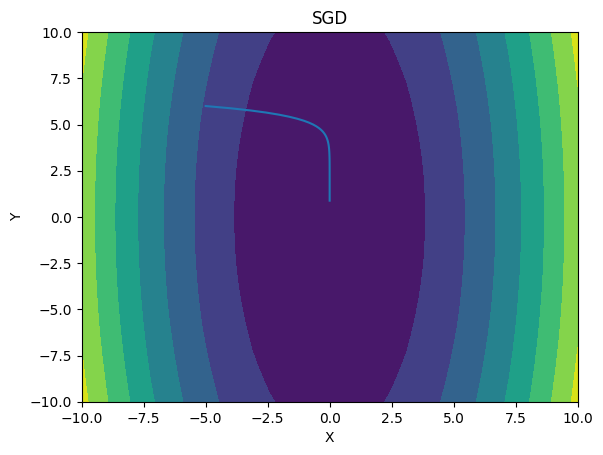

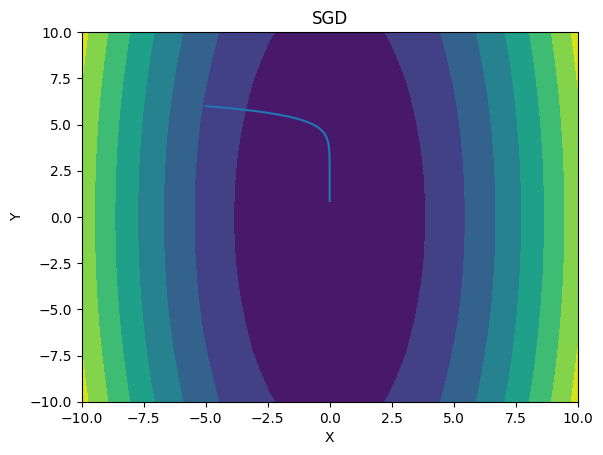

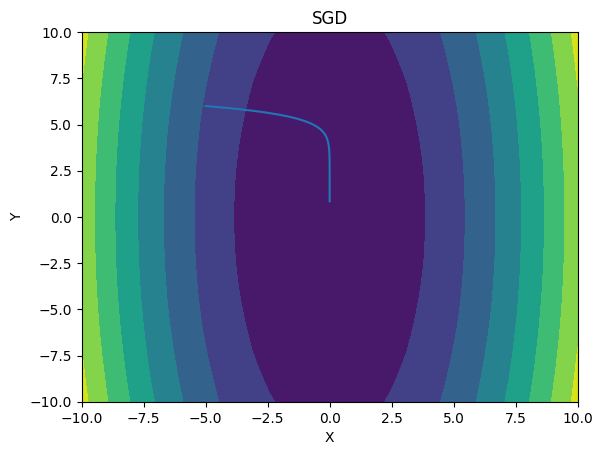

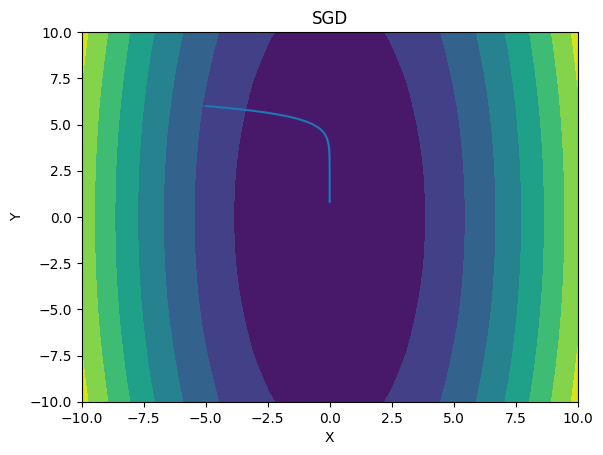

In [8]:
#Generating GIF
for i in range(max_iter):
    x = np.linspace(-10, 10, 30)
    y = np.linspace(-10, 10, 30)
    [A, B] = np.meshgrid(x, y)
    A, B = np.meshgrid(x, y)
    fig, ax = plt.subplots(1, 1)
    C = f(A, B)
    #plots the contour plot of f(x,y)
    ax.contourf(A, B, C)
    #plotting the trajectory till i th iteration
    ax.plot(a1[:i],b1[:i])
    ax.set_title('SGD')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    #saving the figure
    plt.savefig(f'img\SGD\{i:003}',dpi=100,facecolor='white')
#passing the images to the gif function to generate gif
gif('img\SGD','SGD')

SGD with momentum

In [9]:
#initial velocity set to 0
v=0
#list to append value of f(x,y) after each iteration
val_f2=[]
#friction coefficient
rho=0.9
X=Y
#list to append value of X-coordinate after each iteration of SGD with momentum
a2=[]
#list to append value of Y-coordinate after each iteration of SGD with momentum
b2=[]
#SGD with momentum algorithm
for i in range(max_iter):
    val_f2.append(f(X[0],X[1]))
    a2.append(X[0])
    b2.append(X[1])
    v=rho*v+gradf(X[0],X[1])
    X=X-eta*v

C:\Users\prana\AppData\Local\Temp\ipykernel_17396\242795176.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1)
C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1807006928.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img))


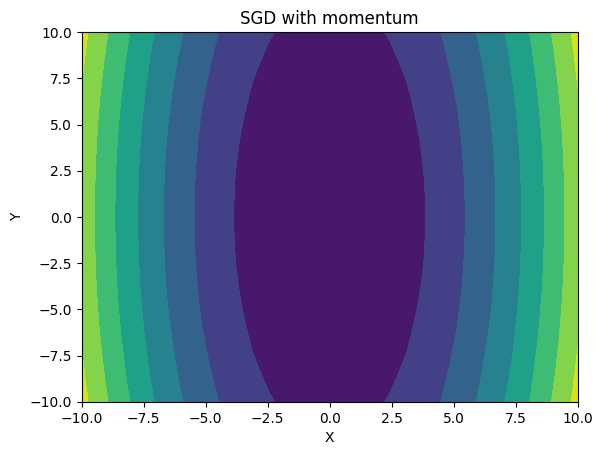

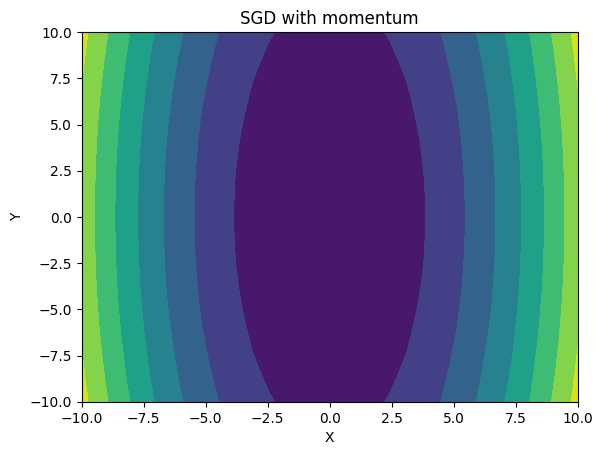

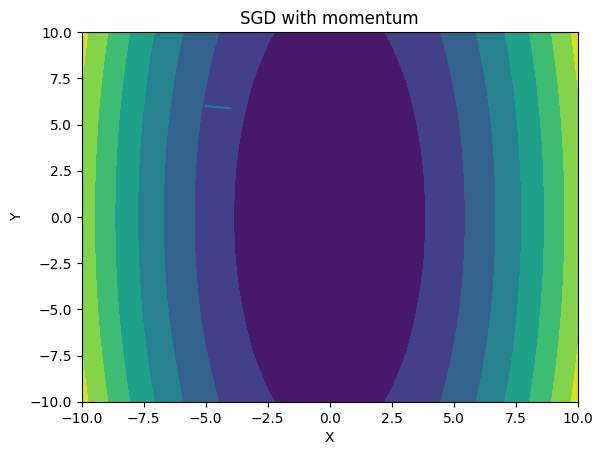

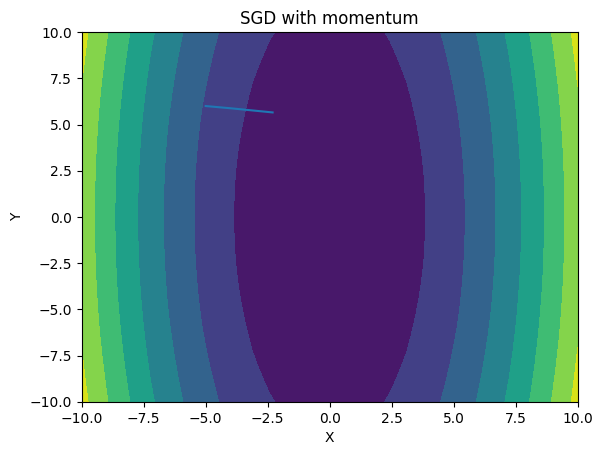

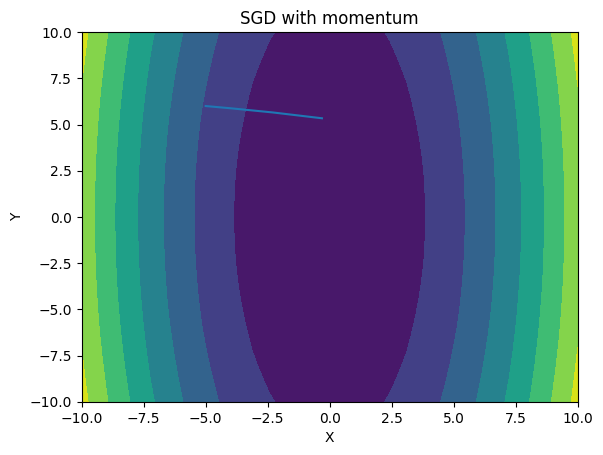

...

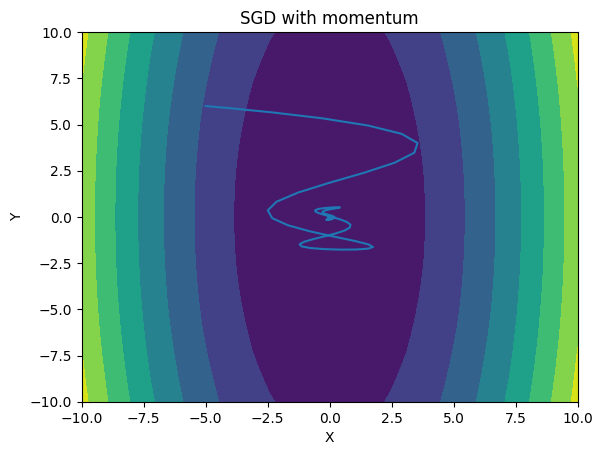

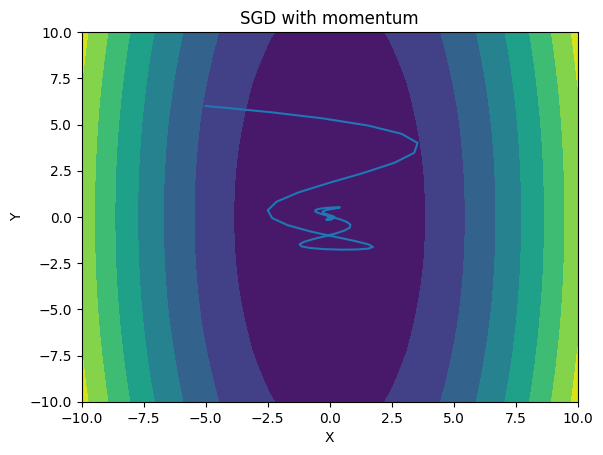

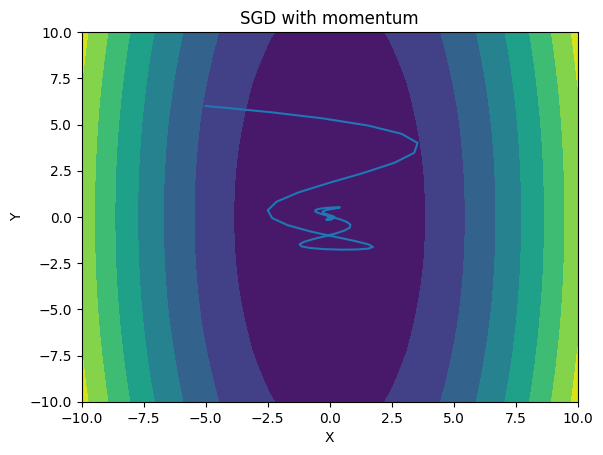

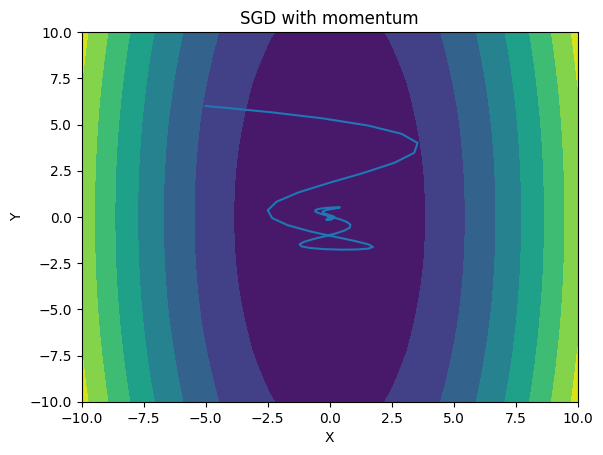

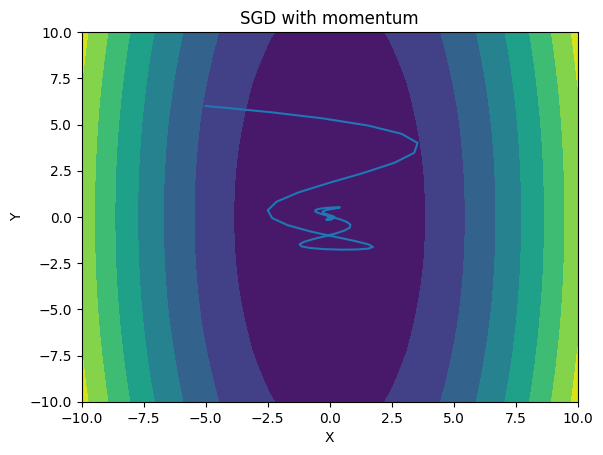

In [10]:
#Generating GIF
for i in range(max_iter):
    x = np.linspace(-10, 10, 30)
    y = np.linspace(-10, 10, 30)

    [A, B] = np.meshgrid(x, y)
    A, B = np.meshgrid(x, y)
    fig, ax = plt.subplots(1, 1)
    C = f(A, B)
    #plots the contour plot of f(x,y)
    ax.contourf(A, B, C)
    #plotting the trajectory till i th iteration
    ax.plot(a2[:i],b2[:i])
    ax.set_title('SGD with momentum')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    #saving the figure
    plt.savefig(f'img\SGD^momentum\{i:003}',dpi=100,facecolor='white')
#passing the images to the gif function to generate gif
gif('img\SGD^momentum','SGD^momentum')

Nestrov Momentum

In [11]:
#initial velocity set to 0
v=0
#list to append value of f(x,y) after each iteration
val_f3=[]
X=Y
#list to append value of X-coordinate after each iteration of Nestrov momentum
a3=[]
#list to append value of Y-coordinate after each iteration of Nestrov momentum
b3=[]
#Nestrov momentum algorithm
for i in range(max_iter):
    val_f3.append(f(X[0],X[1]))
    a3.append(X[0])
    b3.append(X[1])
    X=X-rho*v
    v=rho*v+eta*gradf(X[0],X[1])
    X=X-v
print(X[0],X[1])

-0.007835098912894647 0.031206163497048453


C:\Users\prana\AppData\Local\Temp\ipykernel_17396\2884134989.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1)
C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1807006928.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img))


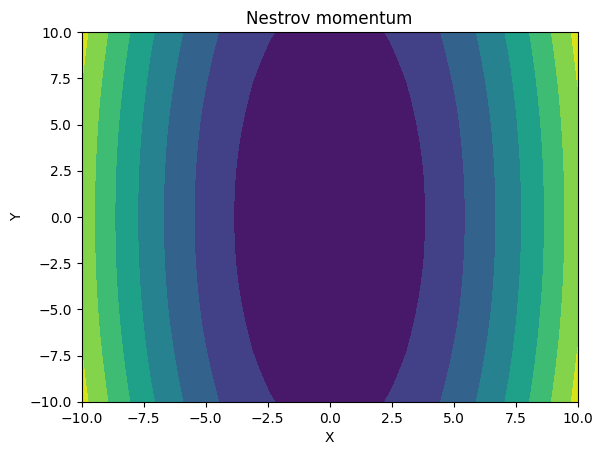

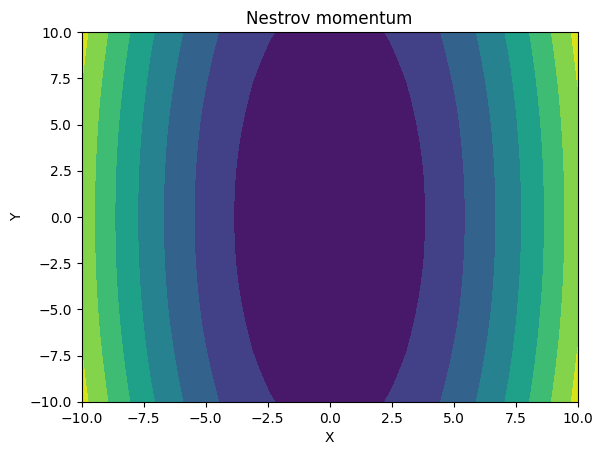

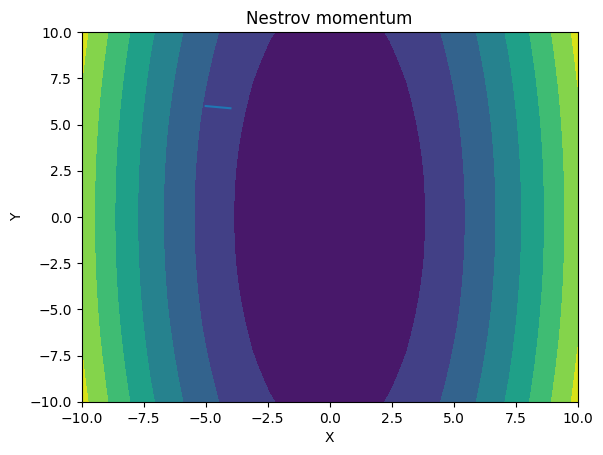

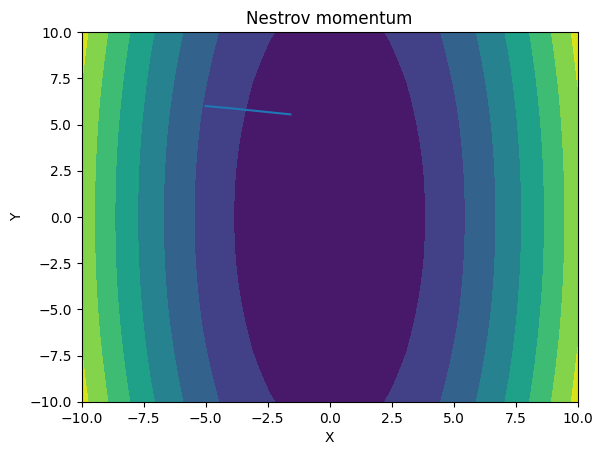

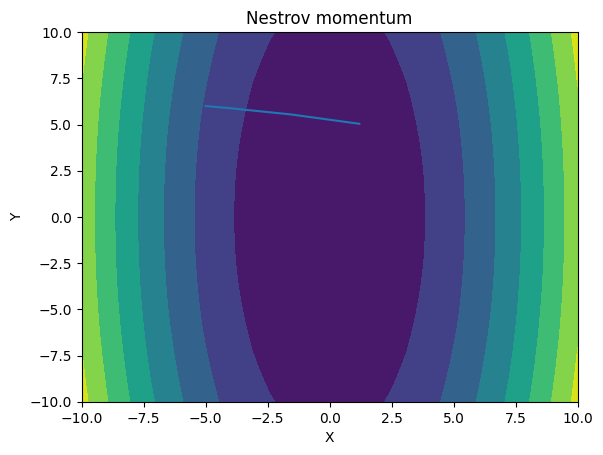

...

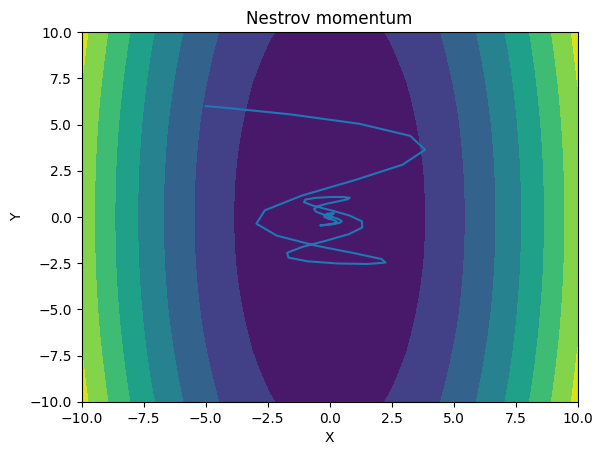

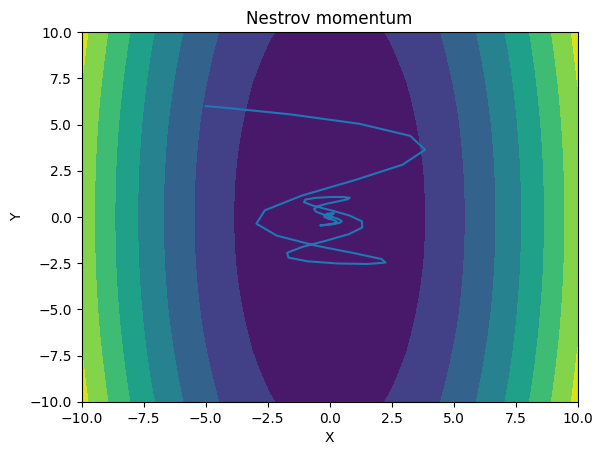

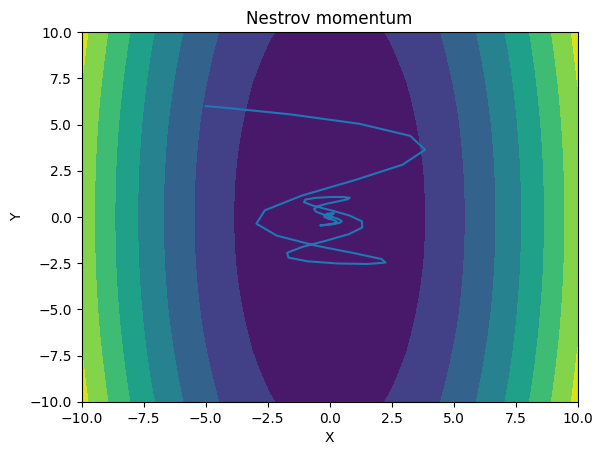

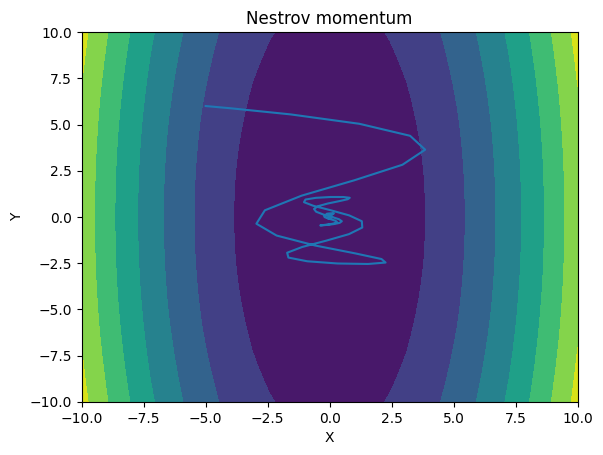

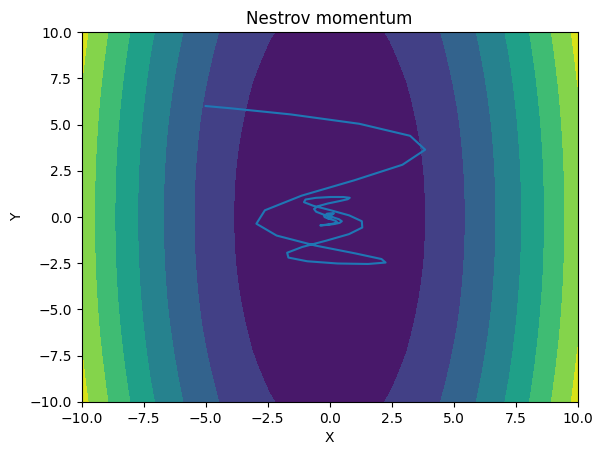

In [12]:
for i in range(max_iter):
    x = np.linspace(-10, 10, 30)
    y = np.linspace(-10, 10, 30)

    [A, B] = np.meshgrid(x, y)
    A, B = np.meshgrid(x, y)
    fig, ax = plt.subplots(1, 1)
    C = f(A, B)
    #plots the contour plot of f(x,y)
    ax.contourf(A, B, C)
    #plotting the trajectory till i th iteration
    ax.plot(a3[:i],b3[:i])
    ax.set_title('Nestrov momentum')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    #saving figure
    plt.savefig(rf'img\Nestrov\{i:003}',dpi=100,facecolor='white')
#passing the images to the gif function to generate gif
gif(r'img\Nestrov',r"Nestrov")

Adagrad

In [13]:
#precision
epsilon=1e-5
#list to append value of f(x,y) after each iteration
val_f4=[]
grad_sq=0
X=Y
#list to append value of X-coordinate after each iteration of Adagrad
a4=[]
#list to append value of Y-coordinate after each iteration of Adagrad
b4=[]
for i in range(max_iter):
    val_f4.append(f(X[0],X[1]))
    a4.append(X[0])
    b4.append(X[1])
    dw=gradf(X[0],X[1])
    grad_sq=grad_sq+np.multiply(dw,dw)
    X=X-eta*(dw/np.sqrt(grad_sq)+epsilon)
print(X[0],X[1])

-4.815400991687892 5.8151646005377975


C:\Users\prana\AppData\Local\Temp\ipykernel_17396\2976283138.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1)
C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1807006928.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img))


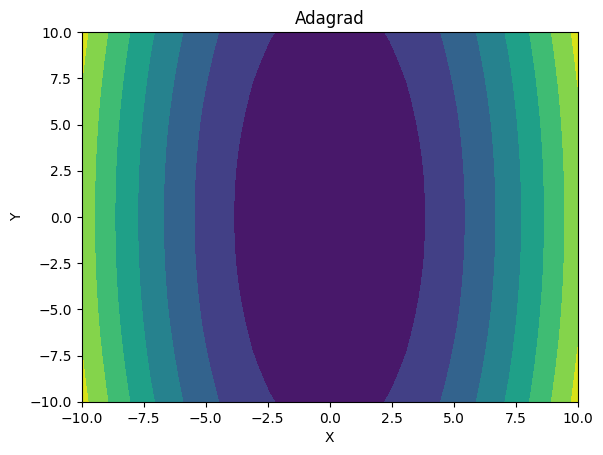

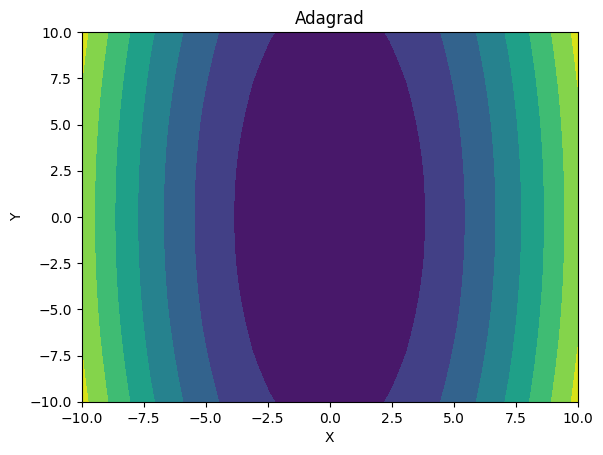

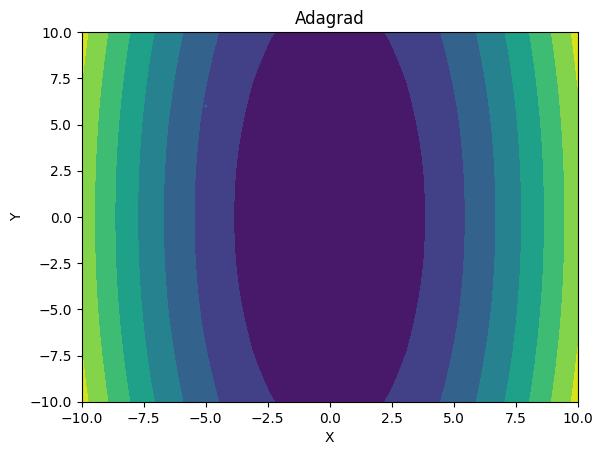

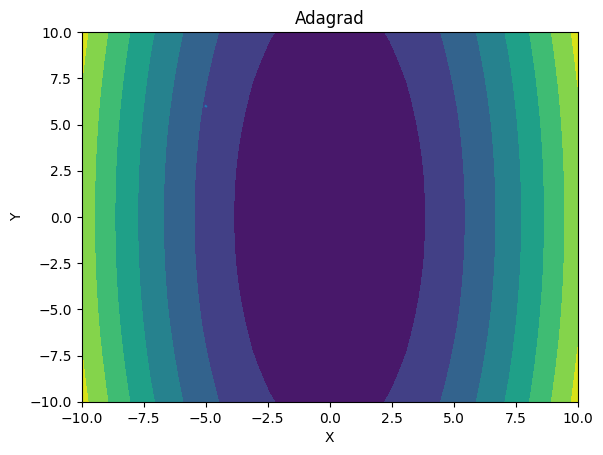

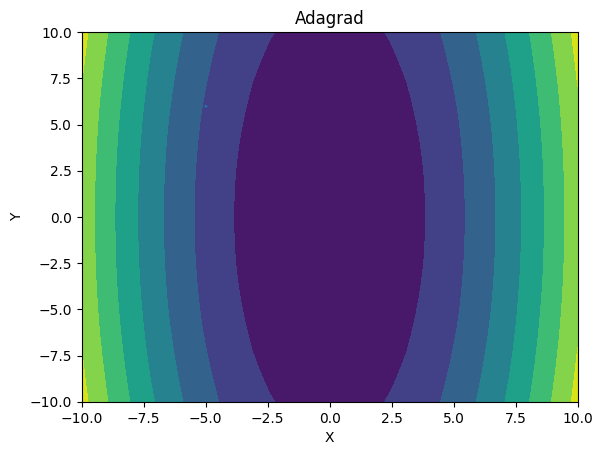

...

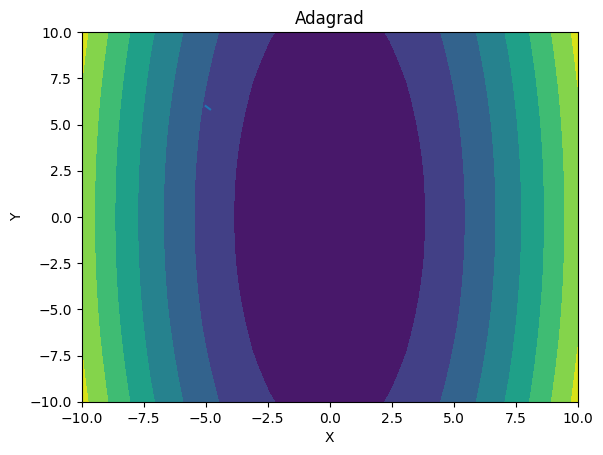

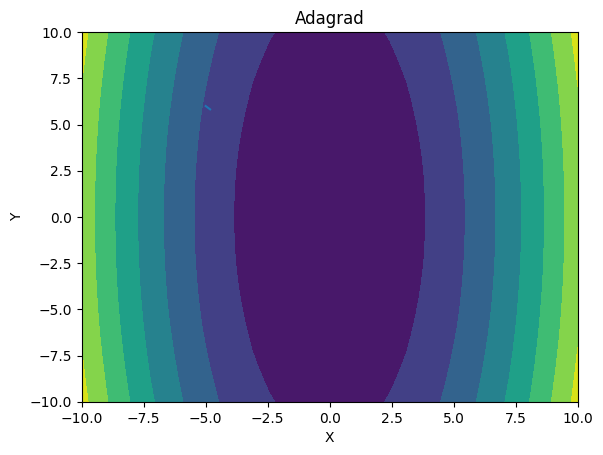

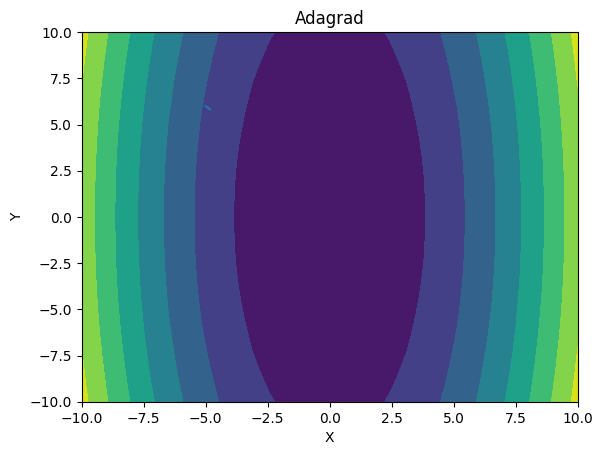

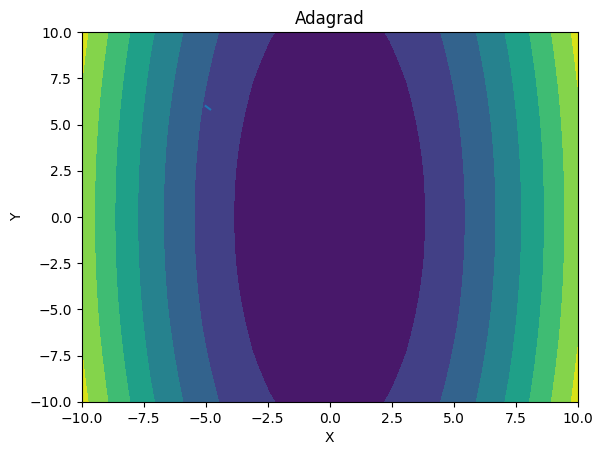

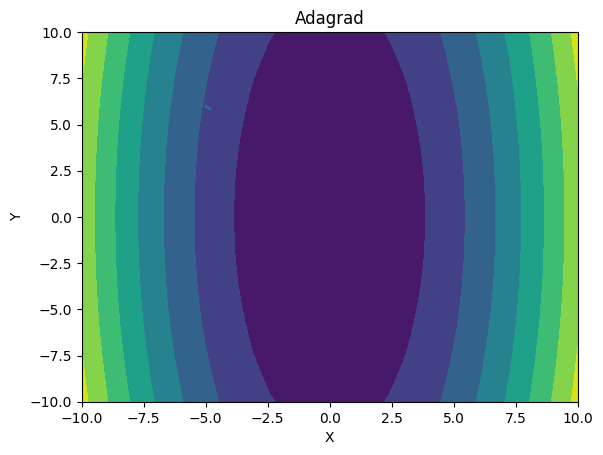

In [14]:
#Generating GIF
for i in range(max_iter):
    x = np.linspace(-10, 10, 30)
    y = np.linspace(-10, 10, 30)

    [A, B] = np.meshgrid(x, y)
    A, B = np.meshgrid(x, y)
    fig, ax = plt.subplots(1, 1)
    C = f(A, B)
    #plots the contour plot of f(x,y)
    ax.contourf(A, B, C)
    #plotting the trajectory till i th iteration
    ax.plot(a4[:i],b4[:i])
    ax.set_title('Adagrad')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    plt.savefig(f'img\Adagrad\{i:003}',dpi=100,facecolor='white')
gif('img\Adagrad','Adagrad') 

RMSProp

In [15]:
#list to append value of f(x,y) after each iteration
val_f5=[]
grad_sq=0
X=Y
#list to append value of X-coordinate after each iteration of RMSProp
a5=[]
#list to append value of Y-coordinate after each iteration of RMSProp
b5=[]
for i in range(max_iter):
    val_f5.append(f(X[0],X[1]))
    a5.append(X[0])
    b5.append(X[1])
    dw=gradf(X[0],X[1])
    grad_sq=rho*grad_sq+(1-rho)*np.multiply(dw,dw)
    X=X-eta*(dw/np.sqrt(grad_sq)+epsilon)
print(X[0],X[1])

-3.927043134985878 4.923663610345688


C:\Users\prana\AppData\Local\Temp\ipykernel_17396\2589585809.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1)
C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1807006928.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img))


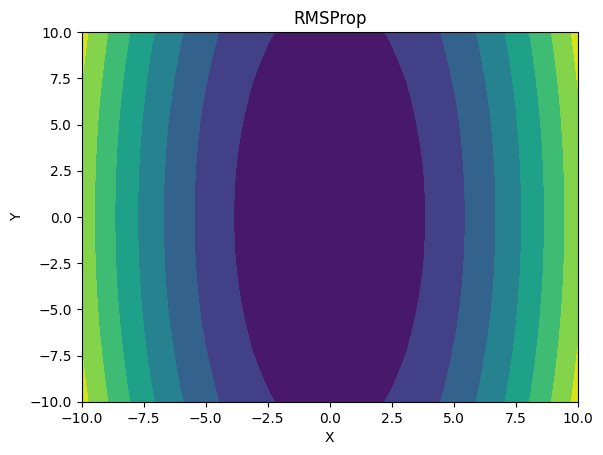

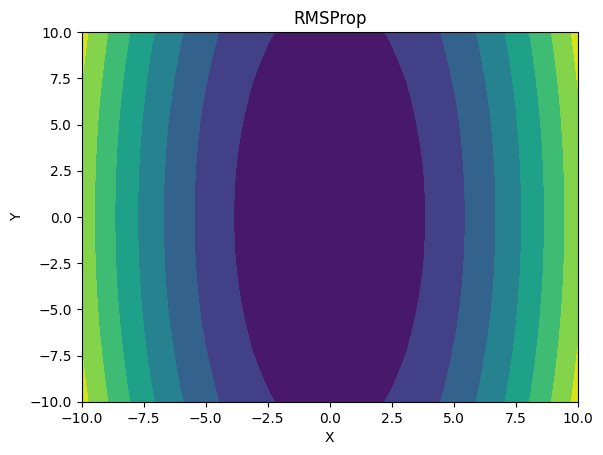

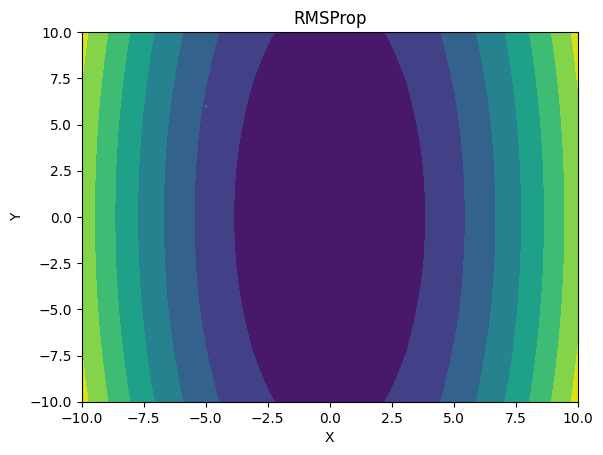

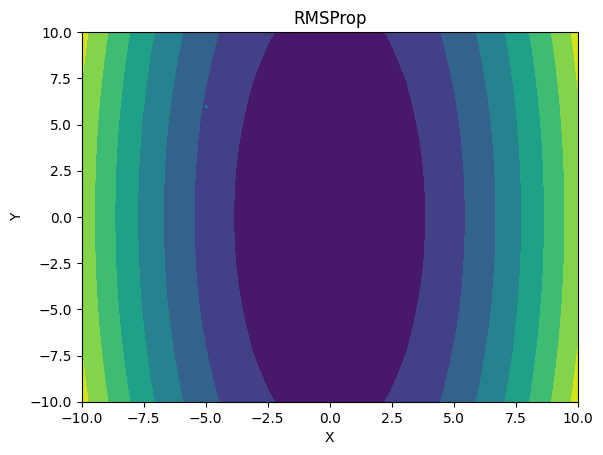

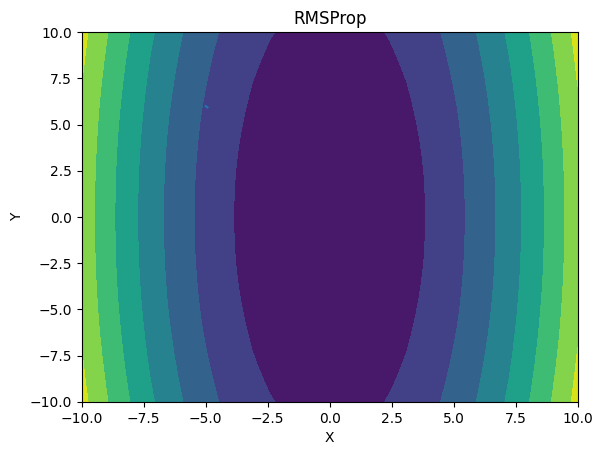

...

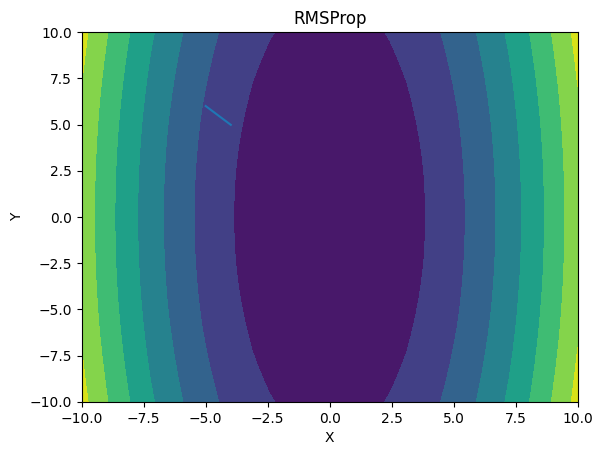

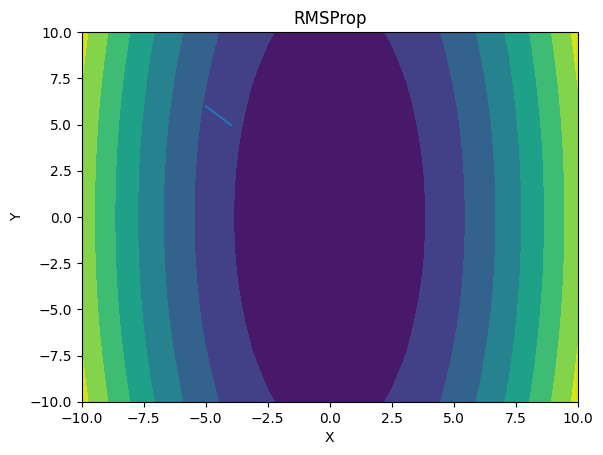

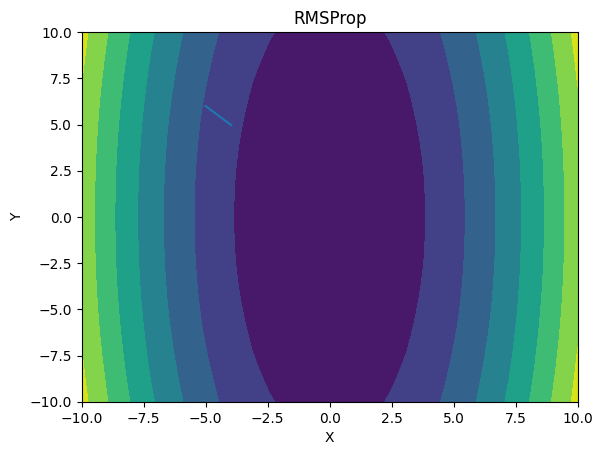

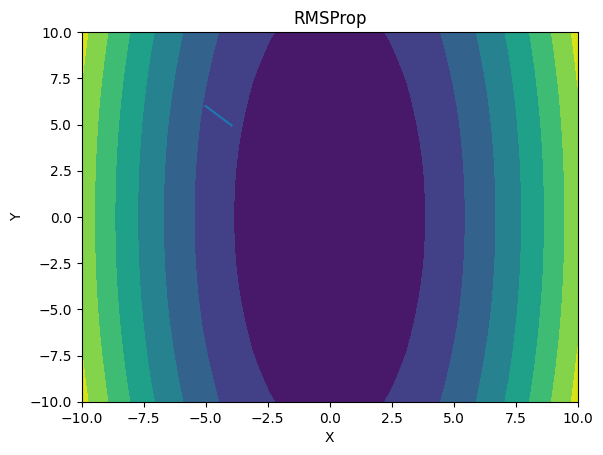

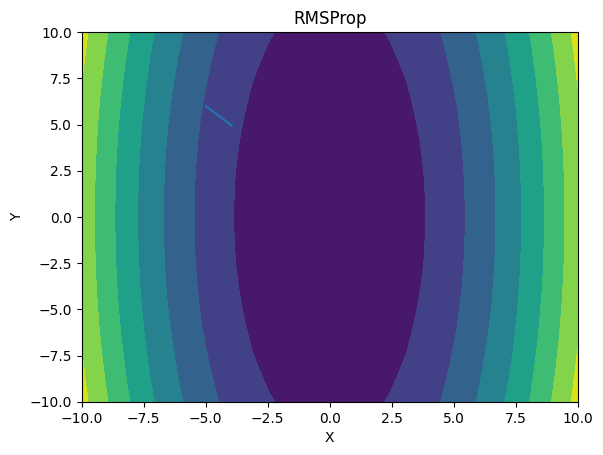

In [16]:
for i in range(max_iter):
    x = np.linspace(-10, 10, 30)
    y = np.linspace(-10, 10, 30)

    [A, B] = np.meshgrid(x, y)
    A, B = np.meshgrid(x, y)
    fig, ax = plt.subplots(1, 1)
    C = f(A, B)
    #plots the contour plot of f(x,y)
    ax.contourf(A, B, C)
    #plotting the trajectory till i th iteration
    ax.plot(a5[:i],b5[:i])
    ax.set_title('RMSProp')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    plt.savefig(f'img\RMSProp\{i:003}',dpi=100,facecolor='white')
gif('img\RMSProp','RMSProp')

2D visualisation

C:\Users\prana\AppData\Local\Temp\ipykernel_17396\3517492794.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1)
C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1807006928.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img))


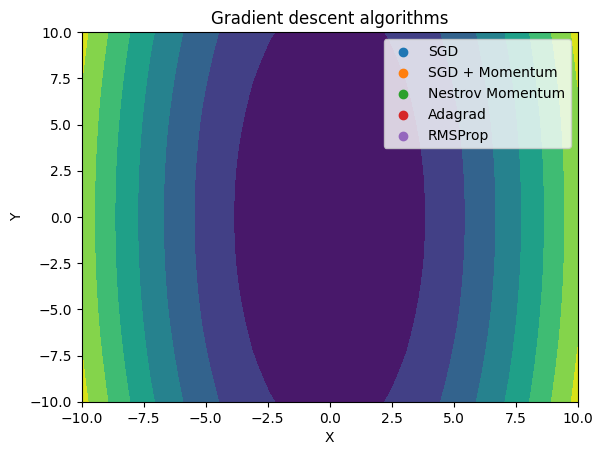

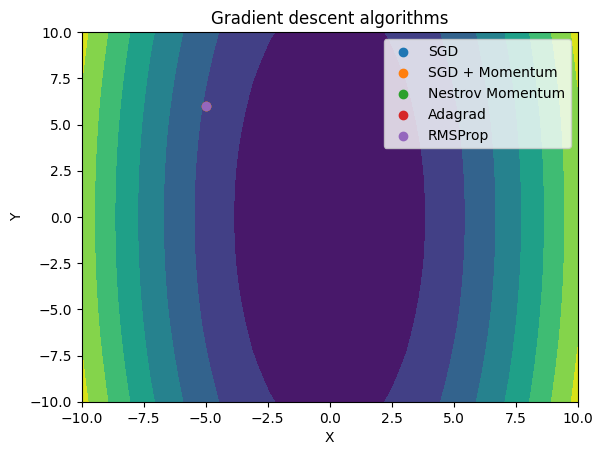

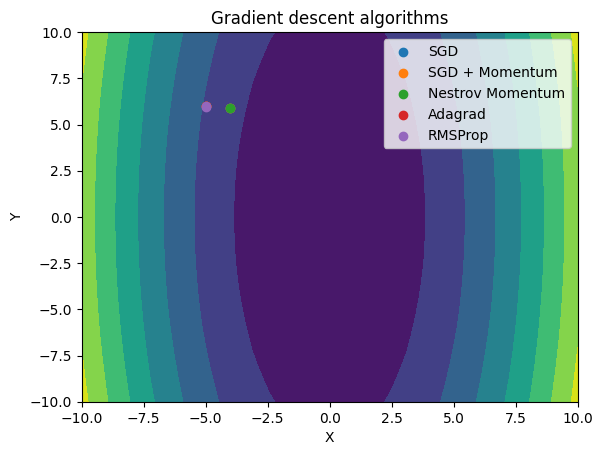

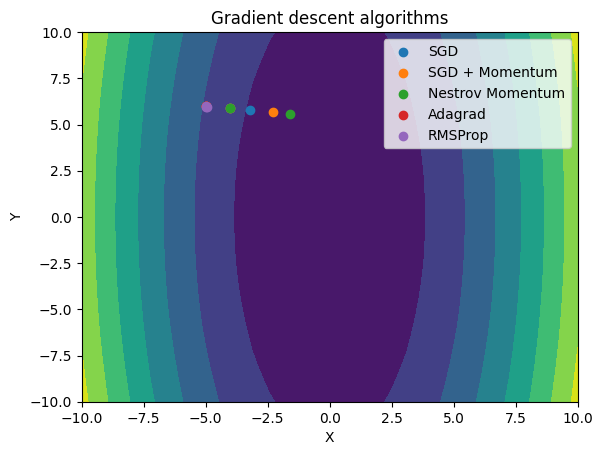

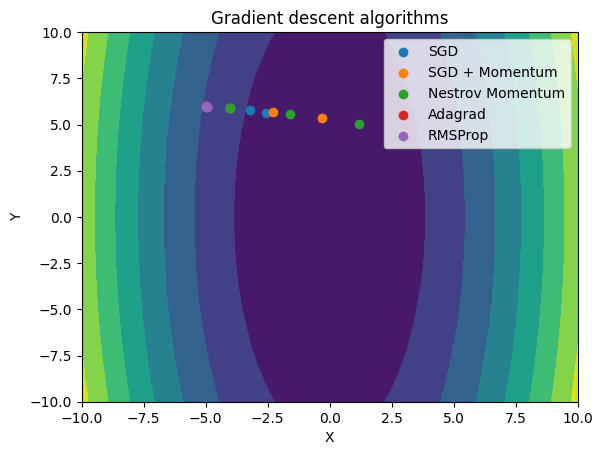

...

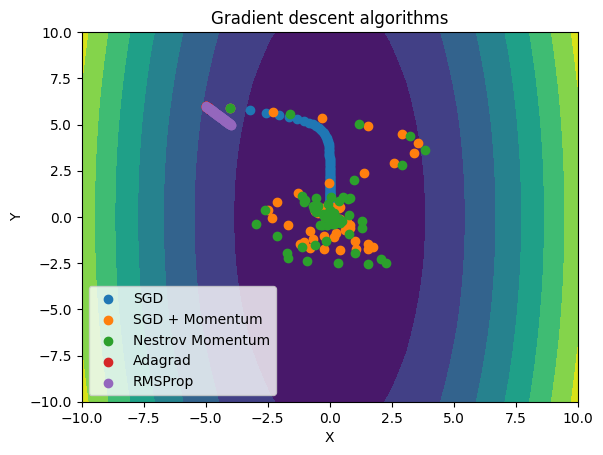

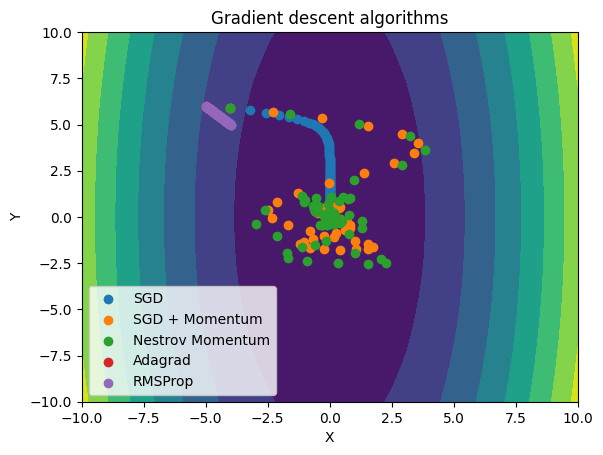

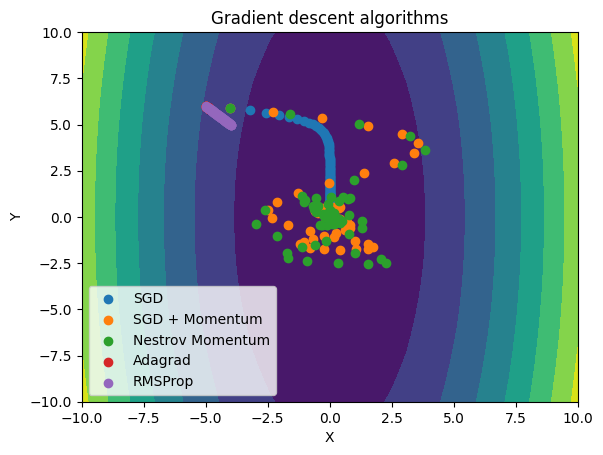

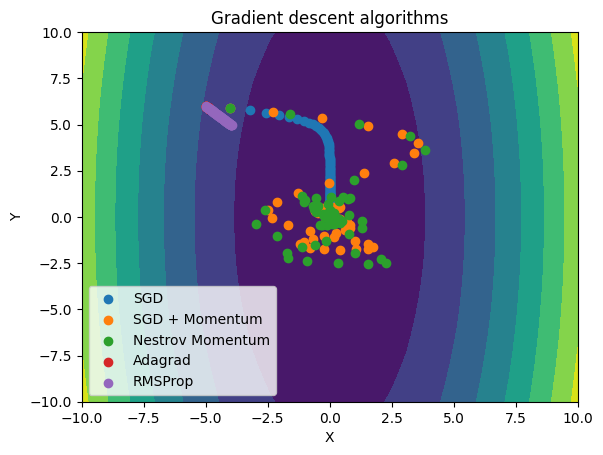

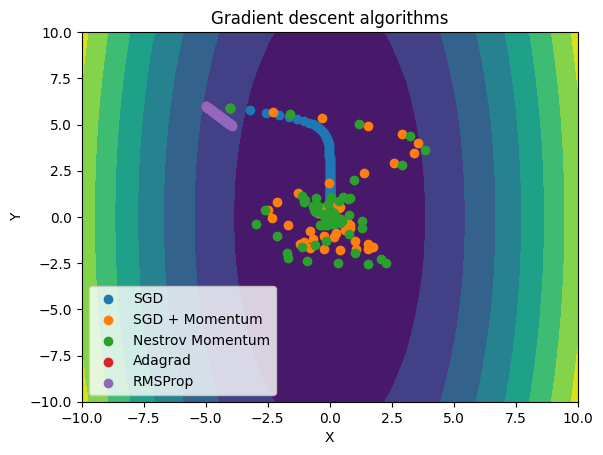

In [17]:
for i in range(max_iter):
    x = np.linspace(-10, 10, 30)
    y = np.linspace(-10, 10, 30)

    [A, B] = np.meshgrid(x, y)
    A, B = np.meshgrid(x, y)
    fig, ax = plt.subplots(1, 1)
    C = f(A, B)
    #contour2D plot of f(x,y)
    ax.contourf(A, B, C)
    #plotting the trajectory till i th iteration using SGD algorithm
    ax.scatter(a1[:i],b1[:i],label='SGD')
    #plotting the trajectory till i th iteration using SGD with momentum
    ax.scatter(a2[:i],b2[:i],label='SGD + Momentum')
    #plotting the trajectory till i th iteration using Nestrov momentum
    ax.scatter(a3[:i],b3[:i],label='Nestrov Momentum')
    #plotting the trajectory till i th iteration using Adagrad
    ax.scatter(a4[:i],b4[:i],label='Adagrad')
    #plotting the trajectory till i th iteration using RMSProp
    ax.scatter(a5[:i],b5[:i],label='RMSProp')
    plt.legend()
    ax.set_title('Gradient descent algorithms')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    #saving figures
    plt.savefig(f'img\GD\{i:003}',dpi=100,facecolor='white')
#generating gif by using the saved figures
gif('img\GD','GD')

3D visualisation

C:\Users\prana\AppData\Local\Temp\ipykernel_17396\1807006928.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(img))


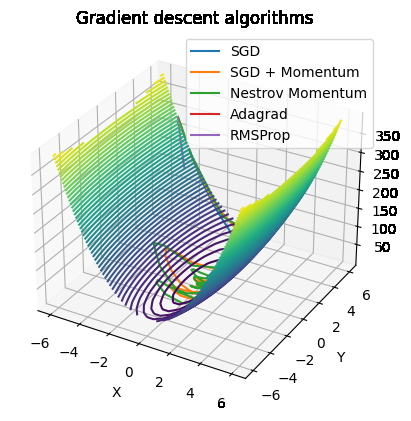

In [18]:
for i in range(max_iter):
    x = np.linspace(-6,6, 30)
    y = np.linspace(-6, 6, 30)

    A, B = np.meshgrid(x, y)
    C = f(A, B)
    ax = plt.axes(projection='3d')
    #contour3D plot of f(x,y)
    ax.contour3D(A, B, C,50)
    #plotting the trajectory till i th iteration using SGD algorithm
    ax.plot3D(a1[:i],b1[:i],val_f1[:i],label='SGD')
    #plotting the trajectory till i th iteration using SGD with momentum
    ax.plot3D(a2[:i],b2[:i],val_f2[:i],label='SGD + Momentum')
    #plotting the trajectory till i th iteration using Nestrov momentum
    ax.plot3D(a3[:i],b3[:i],val_f3[:i],label='Nestrov Momentum')
    #plotting the trajectory till i th iteration using Adagrad
    ax.plot3D(a4[:i],b4[:i],val_f4[:i],label='Adagrad')
    #plotting the trajectory till i th iteration using RMSProp
    ax.plot3D(a5[:i],b5[:i],val_f5[:i],label='RMSProp')
    plt.legend()
    ax.set_title('Gradient descent algorithms')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    plt.savefig(f'img\GD1\{i:003}',dpi=100,facecolor='white')
#generating gif by using the saved figures
gif('img\GD1','GD1')